In [1]:
import os, glob, cv2
import numpy as np
from matplotlib import image as img
from matplotlib import pyplot as plt
import tensorflow as tf

%matplotlib inline

In [2]:
tf.set_random_seed(777)
tmp = np.load('./data2.npz')
data = tmp['img']
data = data[:,:,140:500,:]
lab = tmp['lab']

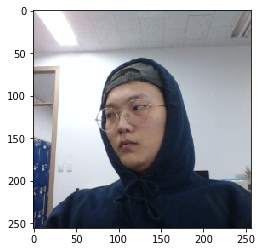

In [3]:
new_data = np.zeros([452,256,256,3], dtype=np.uint8)
for idx, img in enumerate(data):
    #new_data[idx,:,:,:]=cv2.cvtColor(cv2.resize(img, (256,256)), cv2.COLOR_BGR2RGB)
    new_data[idx,:,:,:]=cv2.resize(img, (256,256))
plt.imshow(new_data[-1])
plt.show()

In [4]:
print(new_data.shape)
print(data.shape)
print(lab.shape)

(452, 256, 256, 3)
(452, 360, 360, 3)
(452, 5)


In [5]:
seq=np.random.choice(452, 452, replace=False)

In [6]:
trimg = new_data[seq[0:int(len(seq)*0.8)]]
trlab = lab[seq[0:int(len(seq)*0.8)]]

teimg = new_data[seq[int(len(seq)*0.8):]]
telab = lab[seq[int(len(seq)*0.8):]]


In [7]:
num_classes = 5
X = tf.placeholder(tf.float32, shape=[None, 256, 256,3])
Y = tf.placeholder(tf.float32, shape=[None, num_classes])
keep = tf.placeholder(tf.float32)

In [8]:
weights = {
    'wc1' : tf.get_variable('wc1', [7, 7, 3, 96], dtype=tf.float32, 
                            initializer=tf.contrib.layers.xavier_initializer()),    # 128, 128
    'wc2' : tf.get_variable('wc2', [5, 5, 96, 256], dtype=tf.float32, 
                            initializer=tf.contrib.layers.xavier_initializer()),    # 64, 64
    'wc3' : tf.get_variable('wc3', [3, 3, 256, 512], dtype=tf.float32, 
                            initializer=tf.contrib.layers.xavier_initializer()),    # 32, 32
    'wc4' : tf.get_variable('wc4', [3, 3, 512, 512], dtype=tf.float32, 
                            initializer=tf.contrib.layers.xavier_initializer()),    # 16, 16
    'wc5' : tf.get_variable('wc5', [3, 3, 512, 512], dtype=tf.float32, 
                            initializer=tf.contrib.layers.xavier_initializer()),    # 8, 8
    'wd1' : tf.get_variable('wd1', [15*15*512, 4048], dtype=tf.float32, 
                            initializer=tf.contrib.layers.xavier_initializer()),
    'wd2' : tf.get_variable('wd2', [4048, 4049], dtype=tf.float32, 
                            initializer=tf.contrib.layers.xavier_initializer()),
    'wd3' : tf.get_variable('wd3', [4049, num_classes], dtype=tf.float32, 
                            initializer=tf.contrib.layers.xavier_initializer())
}

biases = {
    'bc1' : tf.Variable(tf.zeros([96]), trainable=True, dtype=tf.float32),
    'bc2' : tf.Variable(tf.zeros([256]), trainable=True, dtype=tf.float32),
    'bc3' : tf.Variable(tf.zeros([512]), trainable=True, dtype=tf.float32),
    'bc4' : tf.Variable(tf.zeros([512]), trainable=True, dtype=tf.float32),
    'bc5' : tf.Variable(tf.zeros([512]), trainable=True, dtype=tf.float32),
    'bd1' : tf.Variable(tf.zeros([4048]), trainable=True, dtype=tf.float32),
    'bd2' : tf.Variable(tf.zeros([4049]), trainable=True, dtype=tf.float32),
    'bd3' : tf.Variable(tf.zeros([num_classes]), trainable=True, dtype=tf.float32)
}

In [9]:
def model(x, w, b, k):
    
    conv1 = tf.nn.conv2d(x, w['wc1'], strides=[1, 1, 1, 1], padding='SAME')
    act1 = tf.nn.relu(conv1 + b['bc1'])
    pool1 = tf.nn.max_pool(act1, ksize=[1, 3, 3, 1], strides=[1, 3, 3, 1], padding='SAME')
    print(pool1)
    conv2 = tf.nn.conv2d(pool1, w['wc2'], strides=[1, 1, 1, 1], padding='SAME')
    act2 = tf.nn.relu(conv2 + b['bc2'])
    pool2 = tf.nn.max_pool(act2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME')
    print(pool2)
    conv3 = tf.nn.conv2d(pool2, w['wc3'], strides=[1, 1, 1, 1], padding='SAME')
    act3 = tf.nn.relu(conv3 + b['bc3'])
    
    conv4 = tf.nn.conv2d(conv3, w['wc4'], strides=[1, 1, 1, 1], padding='SAME')
    act4 = tf.nn.relu(conv4 + b['bc4'])
    
    conv5 = tf.nn.conv2d(conv4, w['wc5'], strides=[1, 1, 1, 1], padding='SAME')
    act5 = tf.nn.relu(conv5 + b['bc5'])
    pool5 = tf.nn.max_pool(act5, ksize=[1, 3, 3, 1], strides=[1, 3, 3, 1], padding='SAME')
    print(pool5)
    flat = tf.reshape(pool5, [-1, 15*15*512])
    
    act6 = tf.nn.relu(tf.matmul(flat, w['wd1'])+b['bd1'])
    drop1 = tf.nn.dropout(act6, keep_prob=k)
    
    act7 = tf.nn.relu(tf.matmul(drop1, w['wd2'])+b['bd2'])
    drop2 = tf.nn.dropout(act7, keep_prob=k)
    
    output = tf.matmul(drop2, w['wd3'])+b['bd3']
    
    out = {
        'act1':act1,
        'act2':act2,
        'act3':act3,
        'act4':act4,
        'act5':act5,
        'act6':act6,
        'act7':act7,
        'output':output
        
    }
    
    
    return out

In [10]:
pred = model(X, weights, biases, keep)

Tensor("MaxPool:0", shape=(?, 86, 86, 96), dtype=float32)
Tensor("MaxPool_1:0", shape=(?, 43, 43, 256), dtype=float32)
Tensor("MaxPool_2:0", shape=(?, 15, 15, 512), dtype=float32)


In [11]:
#cost= tf.reduce_mean(tf.nn.softmax_cross_entropy_with_logits(logits=pred['output'], labels=Y))

cost= tf.reduce_mean(tf.square(pred['output']-Y))


train = tf.train.AdamOptimizer(0.0001).minimize(cost)

collect = tf.equal(tf.argmax(pred['output'], axis=1), tf.argmax(Y, axis=1))

accuracy = tf.reduce_mean(tf.cast(collect, tf.float32))

In [12]:
sess = tf.Session()
sess.run(tf.global_variables_initializer())
saver = tf.train.Saver()

In [13]:
epochs = 10
batch = 5

total_batch = int(len(trimg)/batch)

for epoch in range(epochs):
    
    
    print("\n{0}/{1}".format(epoch+1, epochs))
    
    for i in range(total_batch):
        
        batch_idx = np.random.choice(len(trimg), batch, replace=False)
        
        batch_x = trimg[batch_idx]
        
        batch_y = trlab[batch_idx]
        
        sess.run(train, feed_dict={X:batch_x, Y:batch_y, keep:0.7})
        
        if i%10 ==0:
            
            test_idx = np.random.choice(len(trimg), int(len(trimg)/10), replace=False)
            
            print("Cost : ", sess.run(cost, feed_dict={X:trimg[test_idx], Y:trlab[test_idx], keep:1.}))
            
            print("Accuracy : ", sess.run(accuracy, feed_dict={X:trimg[test_idx], Y:trlab[test_idx], keep:1.}))
            
#saver.save(sess, './checkpoint/')        
print("\n Training Done!")


1/10
Cost :  41024.1
Accuracy :  0.25
Cost :  30.9822
Accuracy :  0.111111
Cost :  0.570148
Accuracy :  0.222222
Cost :  0.20465
Accuracy :  0.277778
Cost :  0.192839
Accuracy :  0.222222
Cost :  0.115879
Accuracy :  0.361111
Cost :  0.135547
Accuracy :  0.305556
Cost :  0.131889
Accuracy :  0.222222

2/10
Cost :  0.134454
Accuracy :  0.361111
Cost :  0.130461
Accuracy :  0.388889
Cost :  0.123314
Accuracy :  0.416667
Cost :  0.114313
Accuracy :  0.527778
Cost :  0.117287
Accuracy :  0.5
Cost :  0.12924
Accuracy :  0.361111
Cost :  0.124065
Accuracy :  0.444444
Cost :  0.12047
Accuracy :  0.361111

3/10
Cost :  0.128389
Accuracy :  0.333333
Cost :  0.118259
Accuracy :  0.305556
Cost :  0.107388
Accuracy :  0.444444
Cost :  0.119035
Accuracy :  0.305556
Cost :  0.111192
Accuracy :  0.472222
Cost :  0.0954502
Accuracy :  0.638889
Cost :  0.0961481
Accuracy :  0.694444
Cost :  0.0927741
Accuracy :  0.527778

4/10
Cost :  0.103764
Accuracy :  0.444444
Cost :  0.104085
Accuracy :  0.5
Cost

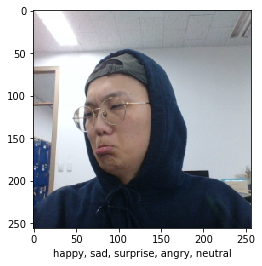

[ 0.          0.70019531  0.          0.30004883  0.        ]
[ 0.19        0.23999999  0.17        0.23999999  0.16      ]


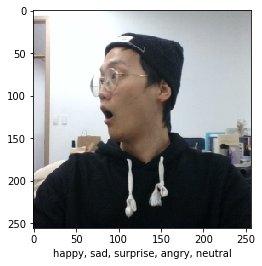

[ 0.  0.  1.  0.  0.]
[ 0.16        0.25        0.23999999  0.2         0.14      ]


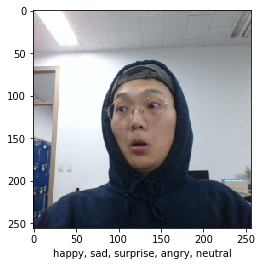

[ 0.  0.  1.  0.  0.]
[ 0.2         0.18000001  0.28999999  0.14        0.2       ]


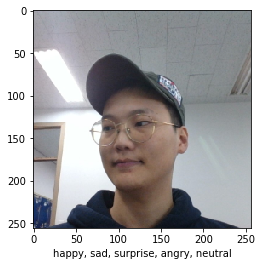

[ 0.5  0.   0.   0.   0.5]
[ 0.27000001  0.16        0.15000001  0.16        0.25999999]


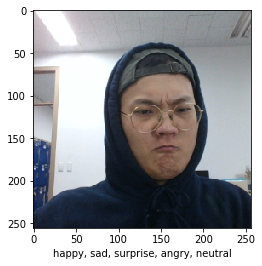

[ 0.          0.30004883  0.          0.70019531  0.        ]
[ 0.20999999  0.22        0.18000001  0.23999999  0.15000001]


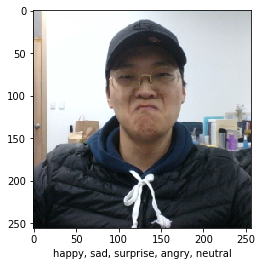

[ 0.          0.39990234  0.          0.60009766  0.        ]
[ 0.23999999  0.16        0.23999999  0.16        0.2       ]


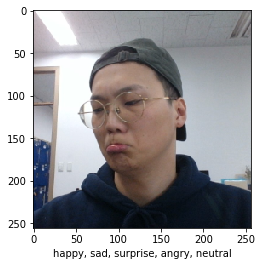

[ 0.          0.89990234  0.          0.09997559  0.        ]
[ 0.16        0.37        0.15000001  0.18000001  0.14      ]


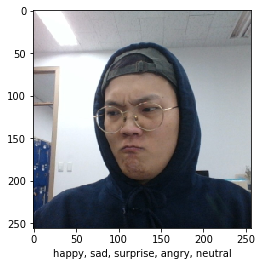

[ 0.          0.30004883  0.          0.70019531  0.        ]
[ 0.28        0.20999999  0.15000001  0.20999999  0.15000001]


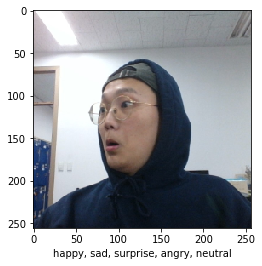

[ 0.  0.  1.  0.  0.]
[ 0.17        0.2         0.28999999  0.17        0.18000001]


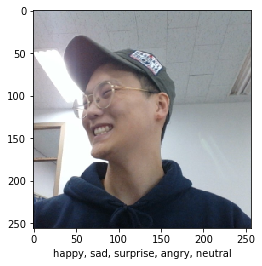

[ 1.  0.  0.  0.  0.]
[ 0.31        0.16        0.22        0.15000001  0.17      ]


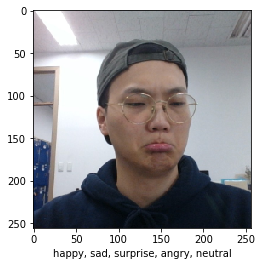

[ 0.          0.89990234  0.          0.09997559  0.        ]
[ 0.16        0.36000001  0.15000001  0.18000001  0.15000001]


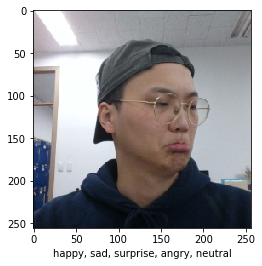

[ 0.          0.89990234  0.          0.09997559  0.        ]
[ 0.16        0.34999999  0.14        0.19        0.15000001]


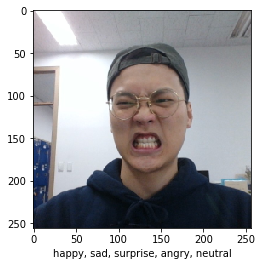

[ 0.  0.  0.  1.  0.]
[ 0.16        0.17        0.14        0.38        0.15000001]


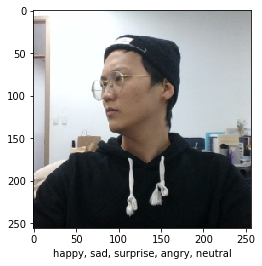

[ 0.          0.          0.          0.79980469  0.19995117]
[ 0.2         0.20999999  0.2         0.20999999  0.18000001]


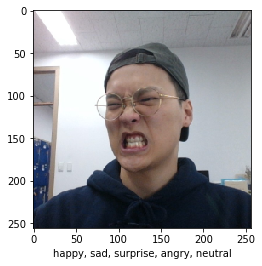

[ 0.  0.  0.  1.  0.]
[ 0.16        0.17        0.15000001  0.37        0.15000001]


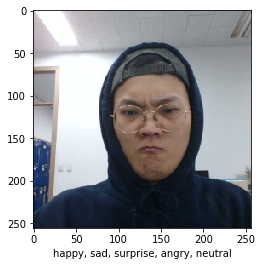

[ 0.          0.30004883  0.          0.70019531  0.        ]
[ 0.25999999  0.20999999  0.17        0.20999999  0.15000001]


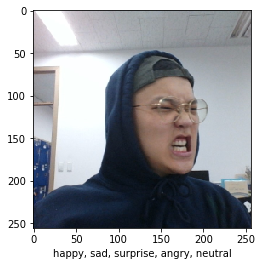

[ 0.  0.  0.  1.  0.]
[ 0.30000001  0.2         0.16        0.19        0.15000001]


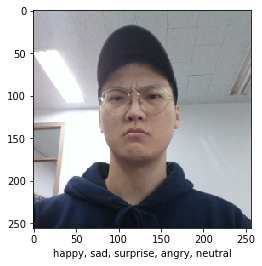

[ 0.  0.  0.  1.  0.]
[ 0.2         0.15000001  0.2         0.31999999  0.12      ]


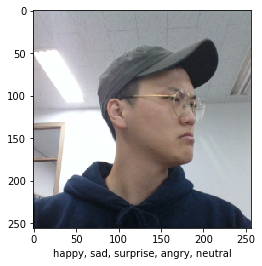

[ 0.          0.09997559  0.          0.89990234  0.        ]
[ 0.18000001  0.16        0.27000001  0.28        0.12      ]


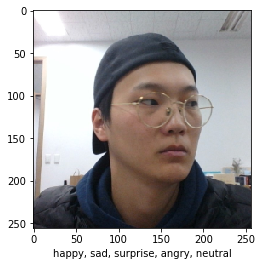

[ 0.  0.  0.  0.  1.]
[ 0.18000001  0.25        0.18000001  0.15000001  0.23999999]


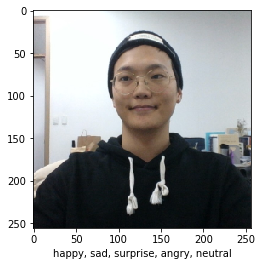

[ 0.5  0.   0.   0.   0.5]
[ 0.22        0.16        0.19        0.20999999  0.22      ]


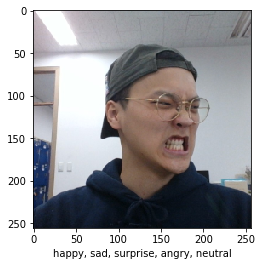

[ 0.  0.  0.  1.  0.]
[ 0.16        0.18000001  0.14        0.37        0.14      ]


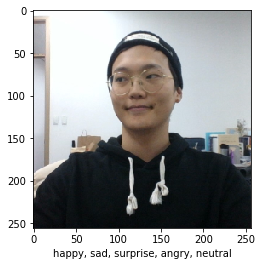

[ 0.5  0.   0.   0.   0.5]
[ 0.22        0.16        0.20999999  0.2         0.20999999]


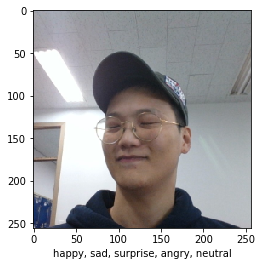

[ 0.70019531  0.          0.          0.          0.30004883]
[ 0.28999999  0.16        0.16        0.16        0.23      ]


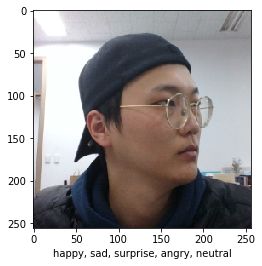

[ 0.  0.  0.  0.  1.]
[ 0.22        0.2         0.23        0.18000001  0.17      ]


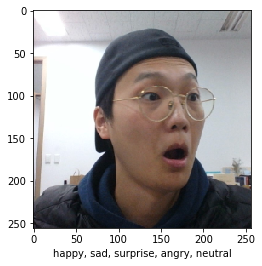

[ 0.  0.  1.  0.  0.]
[ 0.20999999  0.18000001  0.31999999  0.15000001  0.14      ]


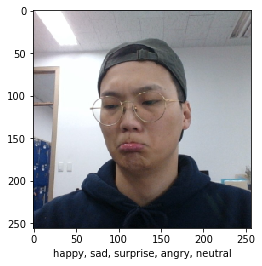

[ 0.          0.89990234  0.          0.09997559  0.        ]
[ 0.15000001  0.38        0.15000001  0.18000001  0.14      ]


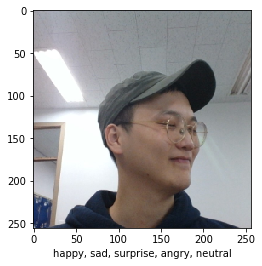

[ 1.  0.  0.  0.  0.]
[ 0.41        0.15000001  0.15000001  0.15000001  0.14      ]


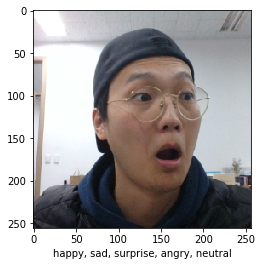

[ 0.  0.  1.  0.  0.]
[ 0.23        0.17        0.30000001  0.15000001  0.16      ]


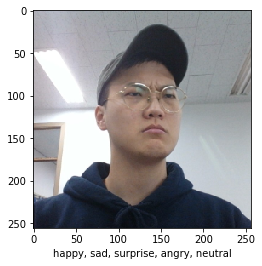

[ 0.          0.09997559  0.          0.89990234  0.        ]
[ 0.23  0.16  0.19  0.28  0.14]


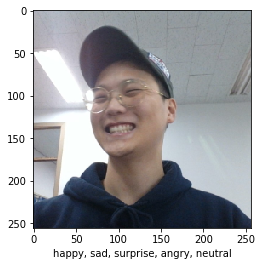

[ 1.  0.  0.  0.  0.]
[ 0.28        0.16        0.23999999  0.16        0.16      ]


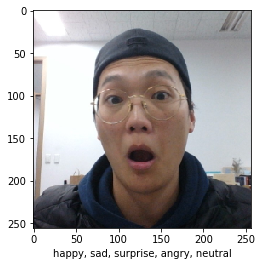

[ 0.  0.  1.  0.  0.]
[ 0.22        0.17        0.30000001  0.15000001  0.17      ]


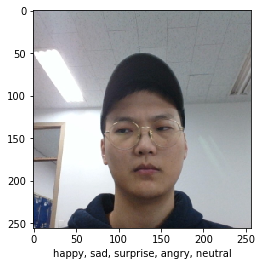

[ 0.  0.  0.  0.  1.]
[ 0.12        0.13        0.13        0.13        0.49000001]


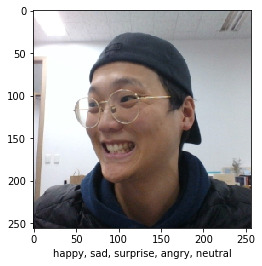

[ 1.  0.  0.  0.  0.]
[ 0.30000001  0.18000001  0.20999999  0.15000001  0.15000001]


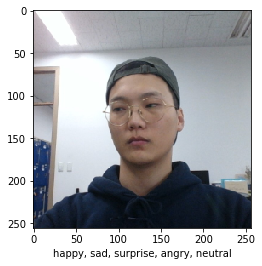

[ 0.  0.  0.  0.  1.]
[ 0.15000001  0.17        0.14        0.15000001  0.38      ]


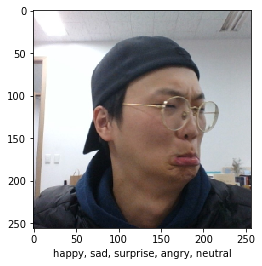

[ 0.  1.  0.  0.  0.]
[ 0.15000001  0.36000001  0.2         0.13        0.15000001]


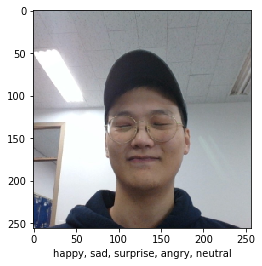

[ 0.70019531  0.          0.          0.          0.30004883]
[ 0.30000001  0.16        0.16        0.16        0.22      ]


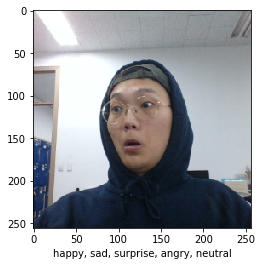

[ 0.  0.  1.  0.  0.]
[ 0.19        0.19        0.28999999  0.15000001  0.18000001]


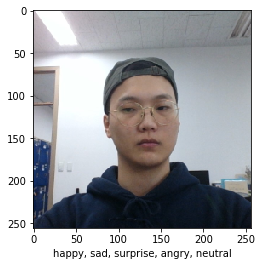

[ 0.  0.  0.  0.  1.]
[ 0.15000001  0.18000001  0.15000001  0.16        0.36000001]


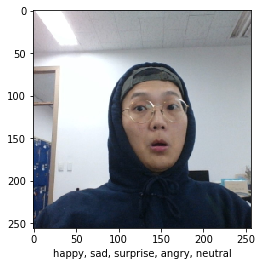

[ 0.  0.  1.  0.  0.]
[ 0.22        0.17        0.28999999  0.14        0.18000001]


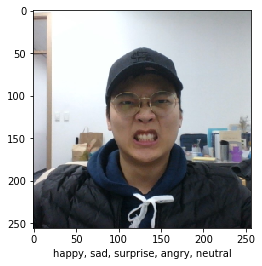

[ 0.  0.  0.  1.  0.]
[ 0.17        0.20999999  0.15000001  0.18000001  0.28999999]


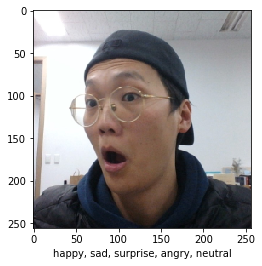

[ 0.  0.  1.  0.  0.]
[ 0.20999999  0.17        0.30000001  0.15000001  0.17      ]


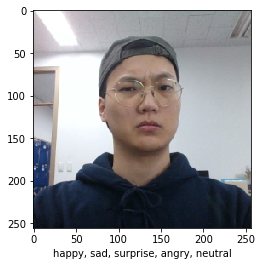

[ 0.          0.09997559  0.09997559  0.79980469  0.        ]
[ 0.17        0.17        0.19        0.30000001  0.17      ]


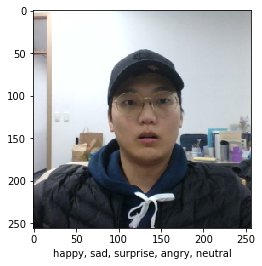

[ 0.          0.19995117  0.70019531  0.          0.09997559]
[ 0.18000001  0.17        0.2         0.18000001  0.25999999]


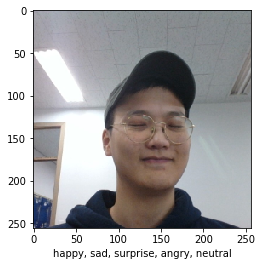

[ 1.  0.  0.  0.  0.]
[ 0.37        0.16        0.16        0.15000001  0.16      ]


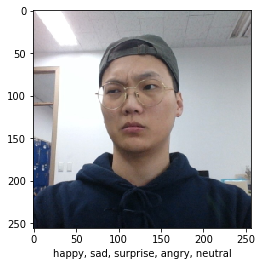

[ 0.          0.09997559  0.09997559  0.79980469  0.        ]
[ 0.16        0.18000001  0.19        0.30000001  0.17      ]


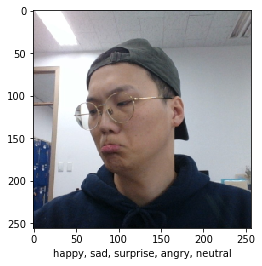

[ 0.          0.89990234  0.          0.09997559  0.        ]
[ 0.16        0.37        0.15000001  0.18000001  0.15000001]


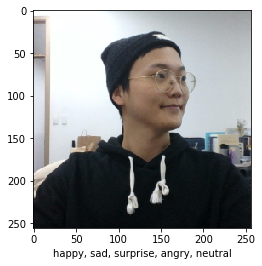

[ 0.39990234  0.          0.          0.          0.60009766]
[ 0.20999999  0.17        0.17        0.23        0.20999999]


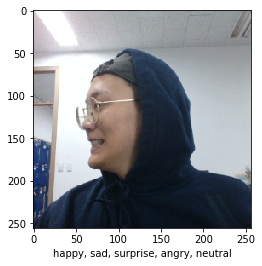

[ 1.  0.  0.  0.  0.]
[ 0.19        0.2         0.20999999  0.23        0.17      ]


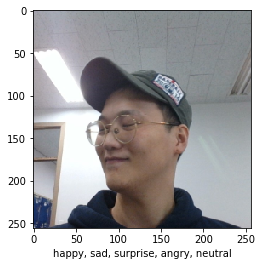

[ 0.70019531  0.          0.          0.          0.30004883]
[ 0.30000001  0.16        0.16        0.16        0.20999999]


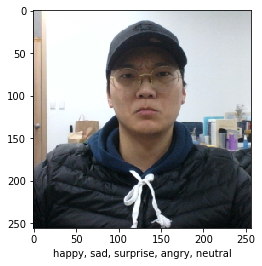

[ 0.          0.19995117  0.          0.70019531  0.09997559]
[ 0.23        0.17        0.23        0.17        0.20999999]


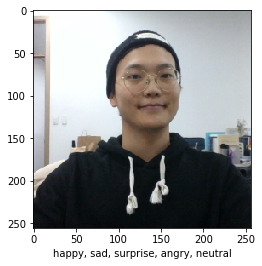

[ 0.5  0.   0.   0.   0.5]
[ 0.23        0.16        0.20999999  0.19        0.20999999]


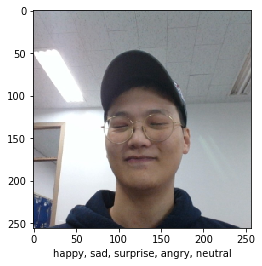

[ 0.70019531  0.          0.          0.          0.30004883]
[ 0.28999999  0.16        0.16        0.16        0.23      ]


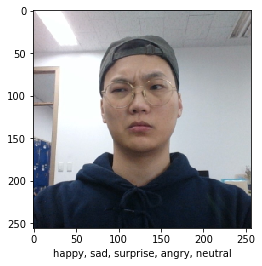

[ 0.          0.09997559  0.09997559  0.79980469  0.        ]
[ 0.16        0.17        0.19        0.30000001  0.17      ]


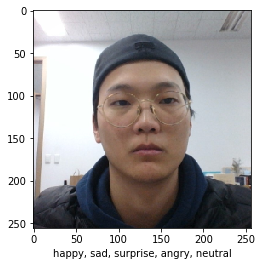

[ 0.  0.  0.  0.  1.]
[ 0.18000001  0.22        0.15000001  0.15000001  0.30000001]


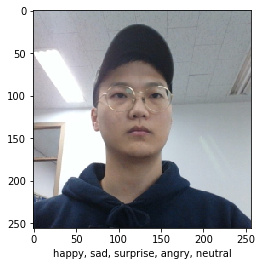

[ 0.  0.  0.  0.  1.]
[ 0.20999999  0.16        0.22        0.13        0.27000001]


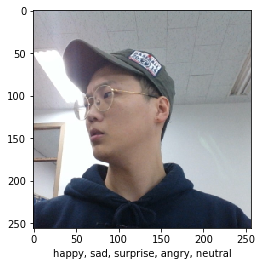

[ 0.          0.          0.19995117  0.79980469  0.        ]
[ 0.2   0.16  0.2   0.31  0.13]


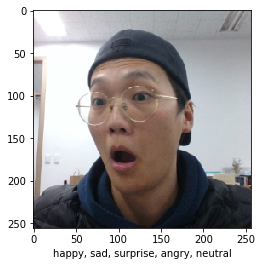

[ 0.  0.  1.  0.  0.]
[ 0.2         0.16        0.31        0.15000001  0.17      ]


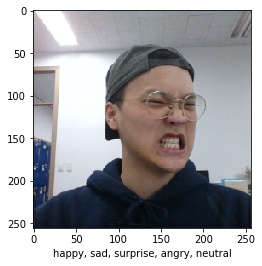

[ 0.  0.  0.  1.  0.]
[ 0.17        0.17        0.13        0.38        0.15000001]


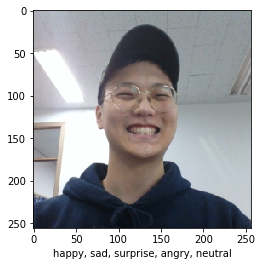

[ 1.  0.  0.  0.  0.]
[ 0.28999999  0.15000001  0.23        0.14        0.19      ]


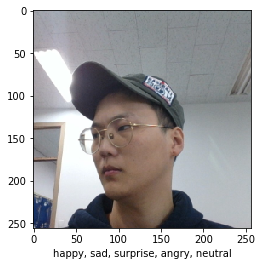

[ 0.  0.  0.  0.  1.]
[ 0.13        0.13        0.14        0.15000001  0.44999999]


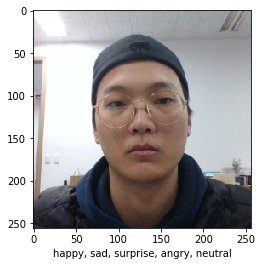

[ 0.  0.  0.  0.  1.]
[ 0.18000001  0.22        0.15000001  0.15000001  0.30000001]


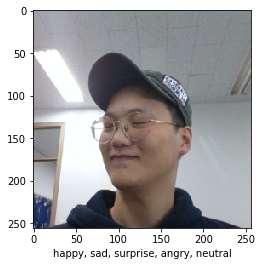

[ 0.70019531  0.          0.          0.          0.30004883]
[ 0.31999999  0.16        0.16        0.16        0.20999999]


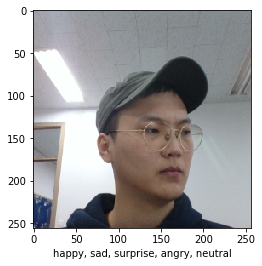

[ 0.  0.  0.  0.  1.]
[ 0.18000001  0.16        0.15000001  0.14        0.36000001]


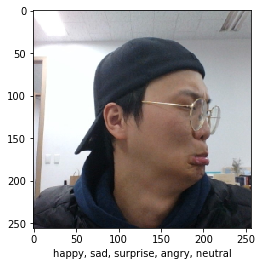

[ 0.  1.  0.  0.  0.]
[ 0.12  0.38  0.17  0.13  0.2 ]


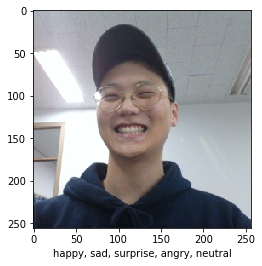

[ 1.  0.  0.  0.  0.]
[ 0.28        0.15000001  0.25        0.16        0.16      ]


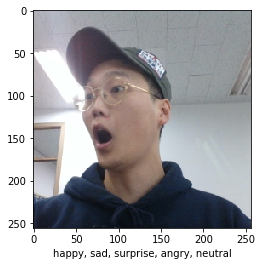

[ 0.  0.  1.  0.  0.]
[ 0.23999999  0.16        0.27000001  0.18000001  0.16      ]


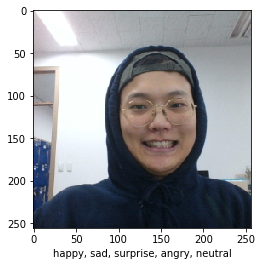

[ 1.  0.  0.  0.  0.]
[ 0.33000001  0.19        0.16        0.18000001  0.14      ]


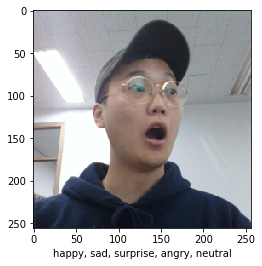

[ 0.  0.  1.  0.  0.]
[ 0.25999999  0.15000001  0.28999999  0.14        0.17      ]


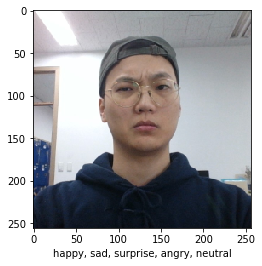

[ 0.          0.09997559  0.09997559  0.79980469  0.        ]
[ 0.17        0.17        0.19        0.30000001  0.17      ]


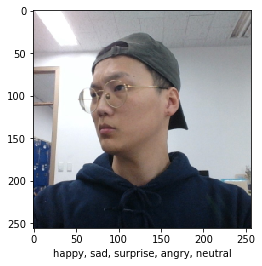

[ 0.          0.09997559  0.09997559  0.79980469  0.        ]
[ 0.18000001  0.17        0.19        0.30000001  0.16      ]


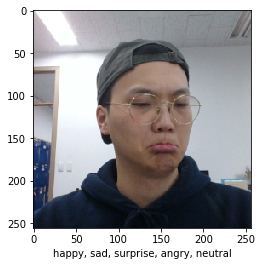

[ 0.          0.89990234  0.          0.09997559  0.        ]
[ 0.16        0.38        0.14        0.18000001  0.15000001]


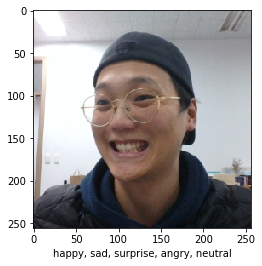

[ 1.  0.  0.  0.  0.]
[ 0.31999999  0.16        0.2         0.15000001  0.16      ]


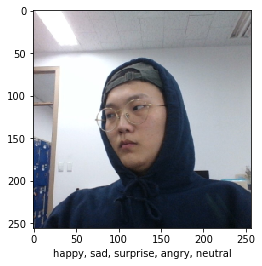

[ 0.  0.  0.  0.  1.]
[ 0.17        0.17        0.15000001  0.13        0.38999999]


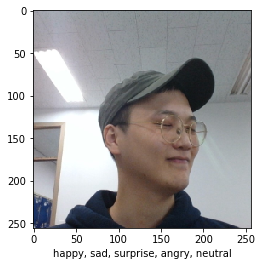

[ 1.  0.  0.  0.  0.]
[ 0.43000001  0.15000001  0.15000001  0.15000001  0.13      ]


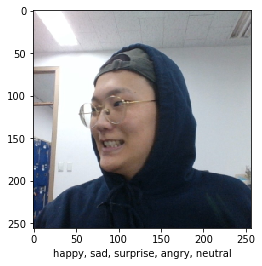

[ 1.  0.  0.  0.  0.]
[ 0.2         0.2         0.17        0.27000001  0.16      ]


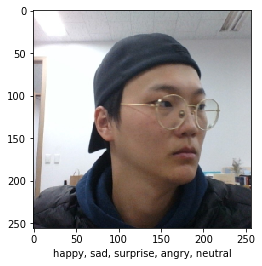

[ 0.  0.  0.  0.  1.]
[ 0.18000001  0.25999999  0.19        0.15000001  0.22      ]


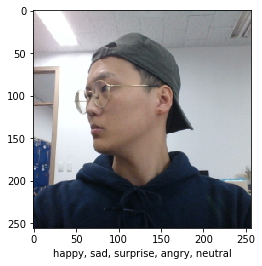

[ 0.          0.09997559  0.09997559  0.79980469  0.        ]
[ 0.18000001  0.18000001  0.2         0.28        0.16      ]


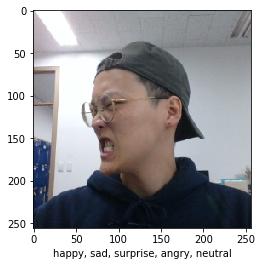

[ 0.  0.  0.  1.  0.]
[ 0.14        0.18000001  0.15000001  0.37        0.15000001]


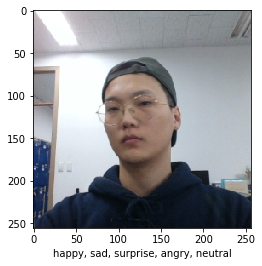

[ 0.  0.  0.  0.  1.]
[ 0.15000001  0.16        0.13        0.15000001  0.41      ]


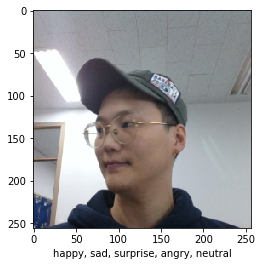

[ 0.5  0.   0.   0.   0.5]
[ 0.28999999  0.16        0.16        0.16        0.22      ]


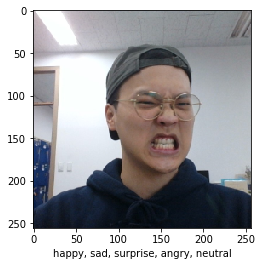

[ 0.  0.  0.  1.  0.]
[ 0.16  0.17  0.14  0.37  0.16]


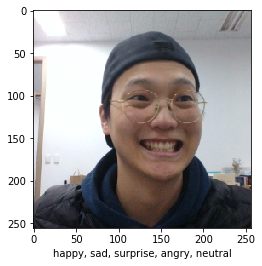

[ 1.  0.  0.  0.  0.]
[ 0.38999999  0.15000001  0.18000001  0.14        0.15000001]


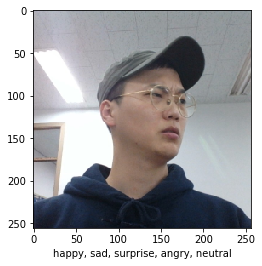

[ 0.  0.  0.  1.  0.]
[ 0.19        0.16        0.19        0.33000001  0.13      ]


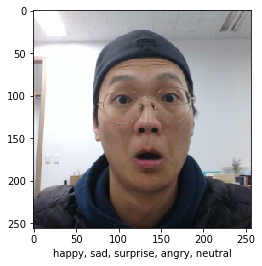

[ 0.          0.09997559  0.89990234  0.          0.        ]
[ 0.17        0.22        0.18000001  0.16        0.27000001]


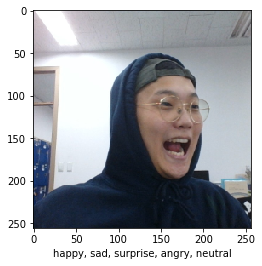

[ 1.  0.  0.  0.  0.]
[ 0.40000001  0.17        0.14        0.15000001  0.14      ]


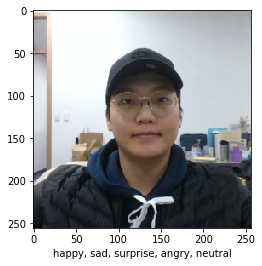

[ 0.5  0.   0.   0.   0.5]
[ 0.18000001  0.17        0.15000001  0.16        0.34      ]


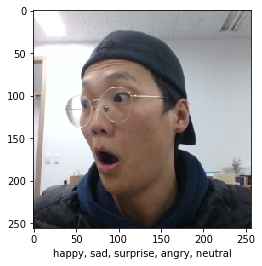

[ 0.  0.  1.  0.  0.]
[ 0.18000001  0.17        0.31999999  0.16        0.17      ]


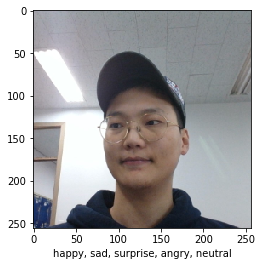

[ 0.5  0.   0.   0.   0.5]
[ 0.25999999  0.16        0.15000001  0.16        0.25999999]


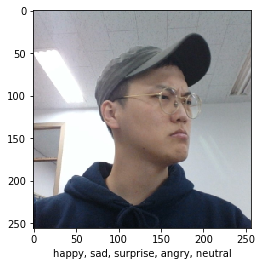

[ 0.          0.09997559  0.          0.89990234  0.        ]
[ 0.18000001  0.16        0.25999999  0.30000001  0.11      ]


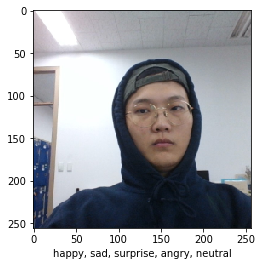

[ 0.  0.  0.  0.  1.]
[ 0.15000001  0.16        0.14        0.14        0.41      ]


In [30]:
for i in range(0,len(teimg),10):
    test = sess.run(tf.nn.softmax(pred['output']), feed_dict={X:teimg[i:i+10], keep:1.})
    for j in range(len(test)):
        
        plt.imshow(teimg[i+j])
        plt.xlabel('happy, sad, surprise, angry, neutral')
        plt.show()
        print(np.around(telab[i+j], decimals=1))
        print(np.around(test[j], decimals=2))